In [67]:
from scipy.stats import mode
from skimage.io import imread, imshow
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import numpy as np

In [68]:
def sobelv(mascara):
    sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],np.float32)
    multiplicacao_matrizes= mascara * sobel
    soma_resultado = np.sum(multiplicacao_matrizes)
    soma_resultado = np.abs(soma_resultado)
    return soma_resultado

In [69]:
def sobelh(mascara):
    sobel = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]],np.float32)
    multiplicacao_matrizes= mascara * sobel
    soma_resultado = np.sum(multiplicacao_matrizes)
    soma_resultado = np.abs(soma_resultado)
    return soma_resultado

In [70]:
def sobel(mascara):
    sobel =(sobelv(mascara)) + (sobelh(mascara))
    return sobel

In [71]:
def scharrh(mascara):
    scharrh = np.array([[3, 10, 3], [0, 0, 0], [-3, -10, -3]])
    multiplicacao_matrizes= mascara * scharrh
    soma_resultado = np.sum(multiplicacao_matrizes)
    soma_resultado = np.abs(soma_resultado)
    return soma_resultado

In [72]:
def scharrv(mascara):
    scharrv = np.array([[3, 0, -3],[10, 0, -10],[3, 0, -3]])
    multiplicacao_matrizes= mascara * scharrv
    soma_resultado = np.sum(multiplicacao_matrizes)
    soma_resultado = np.abs(soma_resultado)
    return soma_resultado

In [73]:
def scharr(mascara):
    scharr =(scharrh(mascara)) + (scharrv(mascara))
    return scharr

In [74]:
def gaussiano(mascara):
    gaussiano = np.array([[1, 4, 7, 4, 1], [4, 16, 26, 16, 4], [7, 26, 41, 26, 7], [4, 16, 26, 16, 4], [1, 4, 7, 4, 1]])
    multiplicacao_matrizes= mascara * gaussiano
    soma_resultado = np.sum(multiplicacao_matrizes)
    return soma_resultado

In [84]:
#Laplaciano centro positivo
def laplaciano(mascara):
    laplaciano = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]], np.float32)
    multiplicacao_matrizes= mascara * laplaciano
    soma_resultado = np.sum(multiplicacao_matrizes)
    soma_resultado = np.abs(soma_resultado)
    return soma_resultado

In [77]:
#Função Média
def media(mascara):
    media = np.mean(mascara)
    return media

In [78]:
#Função Moda
def moda(mascara):
    moda = mascara.flatten()
    moda = mode(moda)
    return moda.mode

In [79]:
#Função Moda
def mediana(mascara):
    mediana = np.median(mascara)
    return mediana

In [80]:
#Função Máximo
def maximo(mascara):
    maximo = np.max(mascara)
    return maximo

In [81]:
#Funcão mínimo
def minimo(mascara):
    minimo = np.min(mascara)
    return minimo

In [82]:
#Função convolução
def convolucao(imagem,filtro,borda='ignore',tamanho_mascara=None):
        
    #Pega as dimensões da imagem original
    linhas_imagem_original,colunas_imagem_original = imagem.shape

    #Pega as dimensões da máscara e atribui para variáveis linhas_mascara e colunas_mascara
    linhas_mascara, colunas_mascara = tamanho_mascara.split(',')
    linhas_mascara = int(linhas_mascara)
    colunas_mascara = int(colunas_mascara)
    if( linhas_mascara % 2 != 1 or colunas_mascara % 2 != 1):
        return "A janela tem que ter tamanho impar"
    
    #Calcula o tamanho das bordas
    borda_esquerda_direita = int((colunas_mascara-1)/2)
    borda_superior_inferior = int((linhas_mascara-1)/2)

    final_linha = int(imagem.shape[0]-borda_superior_inferior)
    final_coluna = int(imagem.shape[1]-borda_esquerda_direita)

    def cantos():
        #Replica o canto superior esquerdo com o primeiro valor da  primeira linha da imagem original
        imagem_processada[0:borda_superior_inferior,0:borda_esquerda_direita] = imagem[0,0]

        #Replica o canto superior direito com o último valor da primeira linha da imagem original
        imagem_processada[0:borda_superior_inferior,imagem_processada.shape[1]-borda_esquerda_direita:imagem_processada.shape[1]] = imagem[0,imagem.shape[1]-1]

        #Replica o canto inferior esquerdo com o primeiro valor da última linha da imagem original
        imagem_processada[imagem_processada.shape[0]-borda_superior_inferior:imagem_processada.shape[0],0:borda_esquerda_direita] = imagem[imagem.shape[0]-1,0]

        #Replica o canto inferior direito com o último valor da última linha da imagem original
        imagem_processada[imagem_processada.shape[0]-borda_superior_inferior:imagem_processada.shape[0],imagem_processada.shape[1]-borda_esquerda_direita:imagem_processada.shape[1]] = imagem[imagem.shape[0]-1,imagem.shape[1]-1]
        

    def varredura_mascara():
        for l in range(borda_superior_inferior, final_linha):
            for c in range(borda_esquerda_direita,final_coluna):
                mascara = imagem[(l-borda_superior_inferior):(l+borda_superior_inferior+1),(c-borda_esquerda_direita):(c+borda_esquerda_direita+1)]
                imagem_processada[l,c] = filtro(mascara)

    if(borda == "ignore"):        
        #Cria nova matriz preenchidas com zero do tamanho da imagem original (sem bordas)
        imagem_processada = np.zeros(((imagem.shape[0]), (imagem.shape[1])), dtype=float)
        varredura_mascara()
        
    elif(borda=="zero"):
        #Cria nova imagem somadas com bordas preenchidas de zero
        imagem_processada = np.zeros(((imagem.shape[0]+(borda_superior_inferior*2)), (imagem.shape[1]+(borda_esquerda_direita*2))), dtype=float)
        for l in range(borda_superior_inferior,imagem_processada.shape[0]-borda_superior_inferior):
            for c in range(borda_esquerda_direita,imagem_processada.shape[1]-borda_esquerda_direita):
                imagem_processada[l,c] = imagem[l-borda_superior_inferior,c-borda_esquerda_direita]

        varredura_mascara()
                
    elif(borda=="replicar"):
        imagem_processada = np.zeros(((imagem.shape[0]+(borda_superior_inferior*2)), (imagem.shape[1]+(borda_esquerda_direita*2))), dtype=float)
        
        #Copia a imagem original para nova imagem
        for l in range(borda_superior_inferior,imagem_processada.shape[0]-borda_superior_inferior):
            for c in range(borda_esquerda_direita,imagem_processada.shape[1]-borda_esquerda_direita):
                imagem_processada[l,c] = imagem[l-borda_superior_inferior,c-borda_esquerda_direita]
                
        #Replica as linhas superiores do início da borda até fim da borda
        for l in range(0, borda_superior_inferior):
            for c in range(borda_esquerda_direita, imagem_processada.shape[1]-borda_esquerda_direita):
                imagem_processada[l,c]=imagem_processada[borda_superior_inferior,c]
        
        #Replica as linhas inferiores do início da borda
        for l in range(imagem_processada.shape[0]-borda_superior_inferior, imagem_processada.shape[0]):
            for c in range(borda_esquerda_direita, imagem_processada.shape[1]-borda_esquerda_direita):
                imagem_processada[l,c]=imagem_processada[imagem_processada.shape[0]-borda_superior_inferior-1,c]

        #Replica os valores da borda esquerda (sem canto superior e inferior esquerdo)
        for l in range(borda_superior_inferior, imagem_processada.shape[0]-borda_superior_inferior):
            for c in range(borda_esquerda_direita):
              imagem_processada[l,c]=imagem_processada[l,borda_esquerda_direita]

        #Replica os valores da borda direita (sem canto superior e inferior direito)
        for l in range(borda_superior_inferior, imagem_processada.shape[0]-borda_superior_inferior):
            for c in range(imagem_processada.shape[1]-borda_esquerda_direita, imagem_processada.shape[1]):
              imagem_processada[l,c]=imagem_processada[l,imagem_processada.shape[1]-borda_esquerda_direita-1]

        cantos()

        varredura_mascara()

        return imagem_processada

    elif(borda=="espelho"):
        #Cria nova imagem somadas com bordas preenchidas de zero
        imagem_processada = np.zeros(((imagem.shape[0]+(borda_superior_inferior*2)), (imagem.shape[1]+(borda_esquerda_direita*2))), dtype=float)
        for l in range(borda_superior_inferior,imagem_processada.shape[0]-borda_superior_inferior):
            for c in range(borda_esquerda_direita,imagem_processada.shape[1]-borda_esquerda_direita):
                imagem_processada[l,c] = imagem[l-borda_superior_inferior,c-borda_esquerda_direita]    

        #Espelha as linhas superiores do início da borda até fim da borda
        contador_crescente=borda_superior_inferior #usado para linha de onde o valor vai ser replicado
        contador_decrescente=borda_superior_inferior #usado para linha que vai receber o valor
        for l in range(0, borda_superior_inferior):          
            for c in range(borda_esquerda_direita, imagem_processada.shape[1]-borda_esquerda_direita):               
                imagem_processada[contador_decrescente-1,c]=imagem_processada[contador_crescente,c]
            contador_decrescente -=1  
            contador_crescente +=1

        #Espelha as linhas inferiores do início da borda até fim da borda
        contador_crescente=imagem_processada.shape[0]-borda_superior_inferior #usado para linha de onde o valor vai ser replicado
        contador_decrescente=imagem_processada.shape[0]-borda_superior_inferior #usado para linha que vai receber o valor
        for l in range(0, borda_superior_inferior):          
            for c in range(borda_esquerda_direita, imagem_processada.shape[1]-borda_esquerda_direita):               
                imagem_processada[contador_crescente,c]=imagem_processada[contador_decrescente-1,c]
            contador_decrescente -=1  
            contador_crescente +=1
        

        #Espelha o lado esquerdo da borda da imagem
        for l in range(borda_superior_inferior,imagem_processada.shape[0]-borda_superior_inferior):
            contador_crescente=borda_esquerda_direita #usado para linha de onde o valor vai ser replicado
            contador_decrescente=borda_esquerda_direita-1 #usado para linha que vai receber o valor 
            for c in range(borda_esquerda_direita):    
                imagem_processada[l,contador_decrescente]=imagem_processada[l,contador_crescente]
                contador_decrescente -=1  
                contador_crescente +=1

        #Espelha o lado esquerdo da borda da imagem
        for l in range(borda_superior_inferior,imagem_processada.shape[0]-borda_superior_inferior):
            contador_crescente=imagem_processada.shape[1]-borda_esquerda_direita #usado para linha que vai recebero valor
            contador_decrescente=imagem_processada.shape[1]-borda_esquerda_direita #usado para linha de onde o valor vair ser replicado
            for c in range(imagem_processada.shape[1]-borda_esquerda_direita, imagem_processada.shape[1]):    
                imagem_processada[l,contador_crescente]=imagem_processada[l,contador_decrescente-1]
                contador_decrescente -=1  
                contador_crescente +=1    
        cantos()
        varredura_mascara()  
        
    return imagem_processada

1) Crie um algoritmo que implemente filtros de convolução. O algoritmo deverá receber como parâmetro a imagem a ser processada, o filtro e o tratamento a ser feito na borda. A função, obrigatoriamente, deverá seguir a seguinte nomenclatura:

   def convolucao(imagem,filtro,borda='ignore'):
       return imagem_processada

A imagem poderá ser colorida ou em tons de cinza. No caso de imagens coloridas, o processamento deverá ser feito em cada banda de cor o resultado será retornado em uma única imagem;
• O filtro será uma matrix MxN, onde M e N são:
     Ímpares;
    Maiores ou iguais a 3;
    Menores que o tamanho da imagem (em cada dimensão).
• O parâmetro borda deverá ter 4 valores possíveis:
    'ignore’: nesse caso a borda não será processada;
    ‘espelho’: no tratamento da borda os pixels serão espelhados;
    ‘zero’: o tratamento da borda será adicionando pixels de valor zero;
    ‘replicar’: nesse caso, no tratamento da borda somente os pixels das linhas extremas serão replicados.
• Teste a função de convolução com pelo menos 5 filtros diferentes. Explique os resultados.

Nesta imagem foi aplicado um Filtro Laplaciano Centro Positivo, que tem como resultado o destaque de áreas onde ocorrem mudanças abruptas de  intensidade, removendo as bordas interiores. Este resultado é obtido por que a máscara tem no seu centro (valor referência para definição da vizinhança) um valor positivo, neste caso, o número 4, enquanto os valores que representam a vizinhança tem valores 0 e -1, isto irá aumentar o valor dos pixels em regiões onde existem grandes variações de intensidade.


Para a questão 1 foram utilizados os filtros para detecção de bordas sobel_h, sobel_v, sobel (junção dos filtros sobel_h e solbel_v), scharr_v, scharr_h  e scharr (junção dos filtros  scharr_v e schar_h). Os filtros de bordas tem a finalidade de destacar as transições abruptas de intensidade em uma imagem, aumentando o contraste entre os pixels que representam a borda e os pixel que representam o fundo, indicando assim a presença de bordas. O principio de funcionamento dos filtros de sobel e scharr são semelhantes, usa-se uma máscara para detecção das bordas horizontais e outras para bordas verticais, o resultado da convolução quando a máscara esta sobre uma região com valores de pixels iguais, ou com variações muito pequenas é igual a 0 ou próxima de 0, o que indica que não existem bordas nesta região, porém, quando a máscara é sobre uma região onde existe uma grande variação de intensidade entre os pixels das extremidades da máscara (diferença entre 1 linha e 3 linha, ou 1 coluna e terceira coluna) o valor da convolução será alto, indicando a presença de uma borda. 

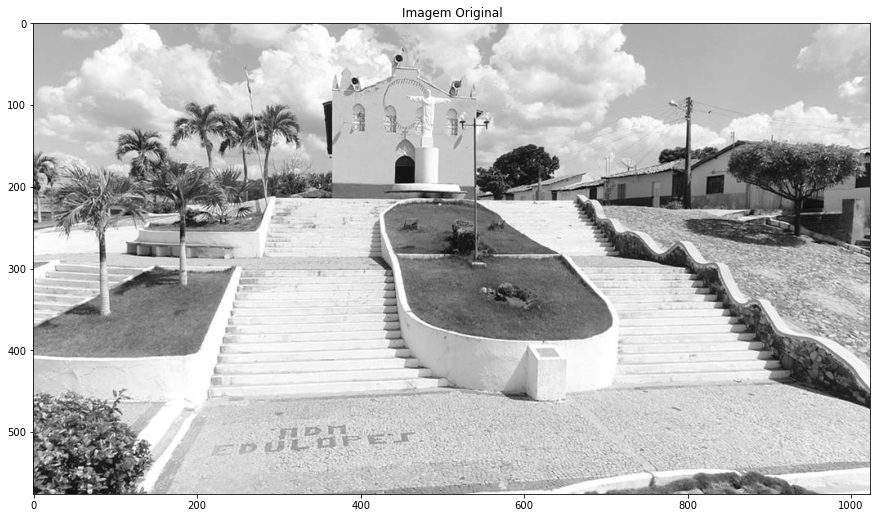

In [62]:
imagem = rgb2gray(imread("igreja.jpg"))
plt.figure(figsize=(15, 20))
plt.imshow(imagem, cmap='gray')
plt.title('Imagem Original')

plt.show()

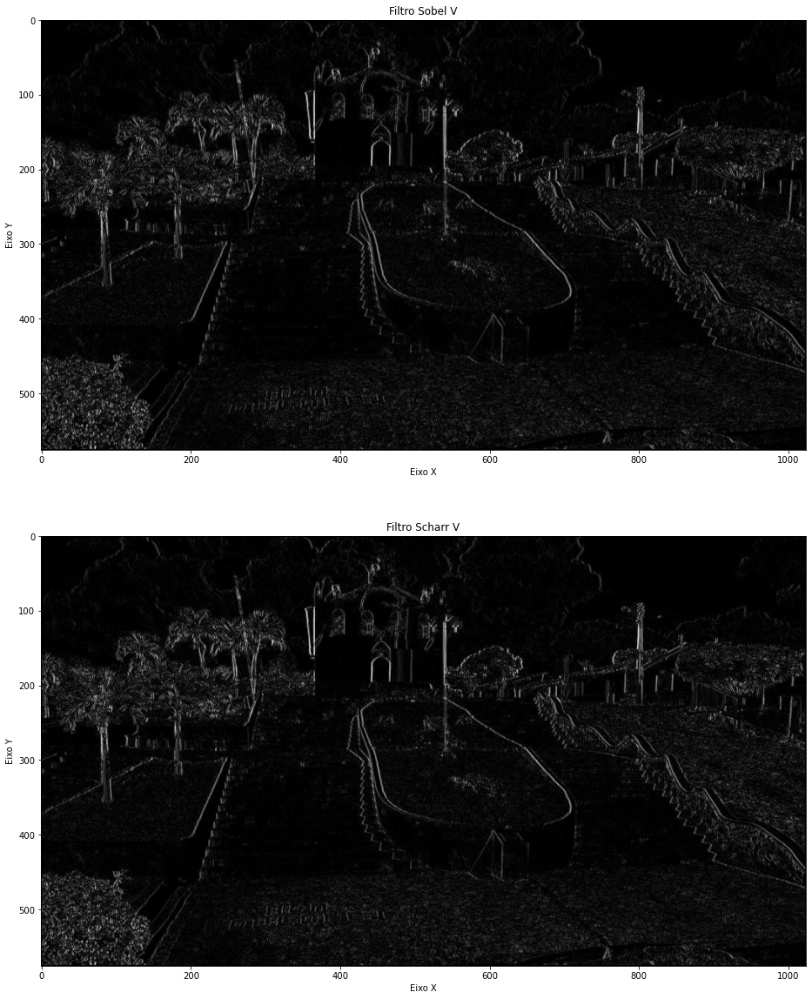

In [64]:
imagem = rgb2gray(imread("igreja.jpg"))
filtro_sobelv = convolucao(imagem,sobelv,"ignore","3,3")
filtro_scharrv = convolucao(imagem,scharrv,"ignore","3,3")
plt.figure(figsize=(20, 20))

plt.subplot(2,1, 1)  
plt.imshow(filtro_sobelv, cmap='gray')
plt.title('Filtro Sobel V')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(2,1,2) 

plt.imshow(filtro_scharrv, cmap='gray')
plt.title('Filtro Scharr V')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.show()

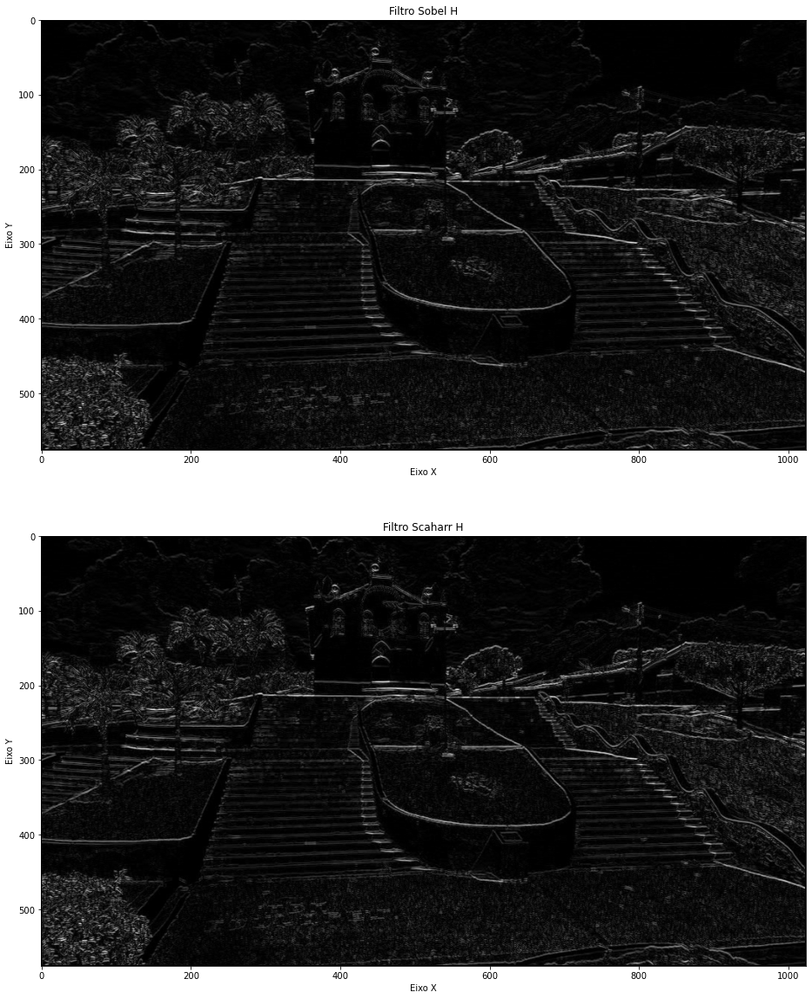

In [61]:
imagem = rgb2gray(imread("igreja.jpg"))
filtro_sobelh = convolucao(imagem,sobelh,"ignore","3,3")
filtro_scharrh = convolucao(imagem,scharrh,"ignore","3,3")
plt.figure(figsize=(20, 20))

plt.subplot(2, 1, 1) 

plt.imshow(filtro_sobelh, cmap='gray')
plt.title('Filtro Sobel H')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(2, 1, 2) 

plt.imshow(filtro_scharrh, cmap='gray')
plt.title('Filtro Scaharr H')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.show()

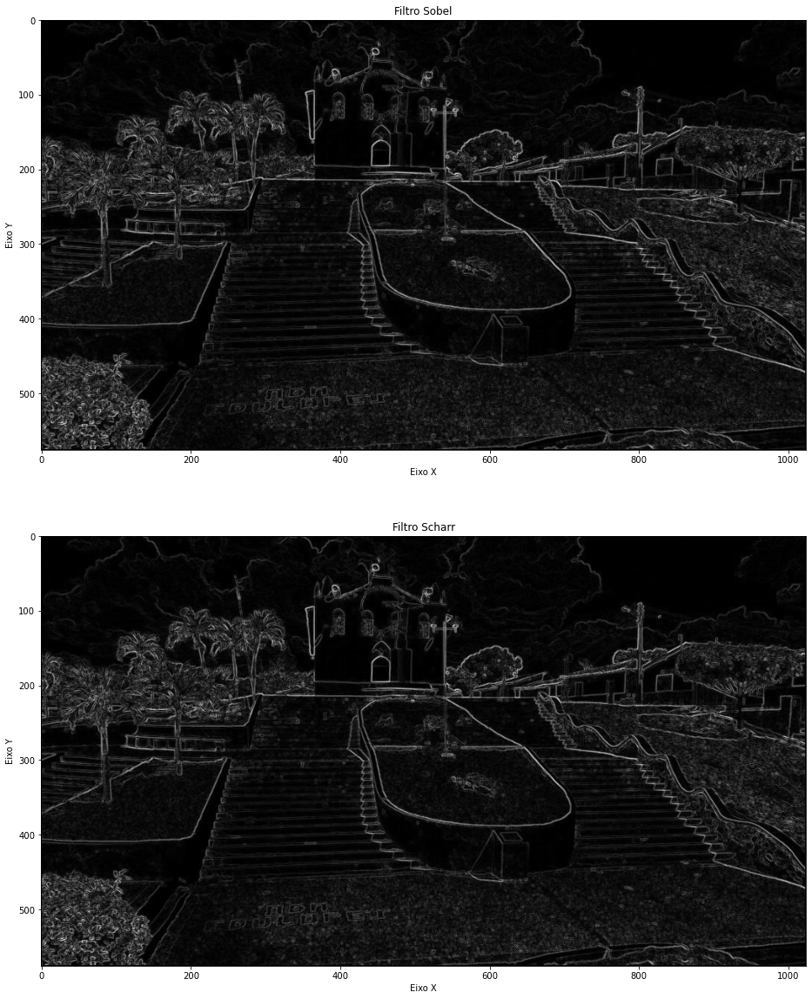

In [131]:
filtro_sobel = convolucao(imagem,sobel,"ignore","3,3")
filtro_scharr = convolucao(imagem,scharr,"ignore","3,3")

plt.figure(figsize=(20, 20))

plt.subplot(2, 1, 1)  
plt.imshow(filtro_sobel, cmap='gray')
plt.title('Filtro Sobel')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(2, 1, 2) 

plt.imshow(filtro_scharr, cmap='gray')
plt.title('Filtro Scharr')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.show()

2) Crie uma função para aplicar filtros não-lineares, os filtros possíveis deverão ser o seguinte:
a. Mediana
b. Moda
c. Máximo
d. Mínimo

Filtro de Moda: Após aplicação do filtro de moda a imagem ficou com um aspecto de borrada e ruídos principalmente na cor branca. Os ruídos ocorreram principalmente nas regiões onde existem transições de intensidade abruptas, e acontece porque ao explorar uma região onde o pixel central que vai receber o valor tem um valor baixo, e a vizinhança contém um píxel de valor alto que aparece mais vezes nessa janela, o pixel de valor alto será o novo valor do píxel central.

Filtro de Mediana: O filtro de mediana foi aplicado na imagem que recebeu o filtro de moda (que resultou em ruídos), afim de mostrar melhor seus efeitos. Como pode ser observado, o ruído foi reduzido, isso acontece porque no cálculo de mediana os valores dos pixels dentro da janela são ordenados, e o valor mediano é atribuído ao pixel central, dessa forma, o resultado final não sofre influência dos pixels outliers.

Filtro de Máximo: A imagem que recebeu o filtro de máximo ficou com uma tonalidade mais branca, isso se deve pelo fato de que, ao explorar uma janela, o maior valor dela será atribuído atribuído ao pixel central, e já que os maiores valores são os que tendem para o branco, conseqüentemente o resultado final será uma imagem mais com tonalidade mais branca.

Filtro de Mínimo: O resultado desse filtro é o inverso do filtro de máximo, já que o pixel central é substituído pelo menor valor da janela verificada, o resultado final é uma imagem mais escura.

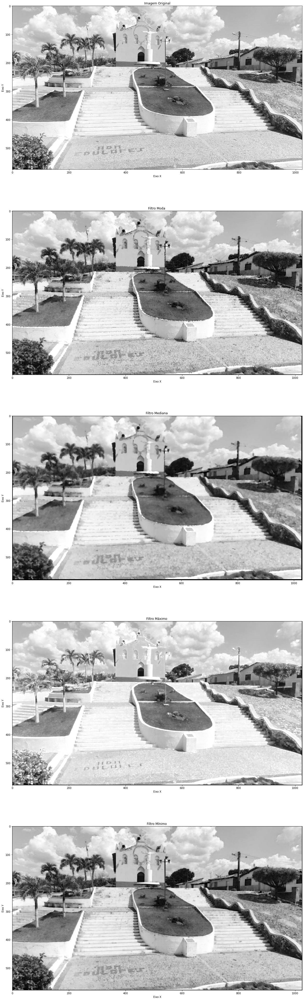

In [83]:
imagem = rgb2gray(imread("igreja.jpg"))*255
filtro_moda = convolucao(imagem,moda,"zero","3,3")
filtro_mediana = convolucao(filtro_moda,mediana,"zero","5,5")
filtro_maximo = convolucao(imagem,maximo,"zero","3,3")
filtro_minimo = convolucao(imagem,minimo,"zero","3,3")

plt.figure(figsize=(20, 70))

plt.subplot(5, 1, 1)  
plt.imshow(imagem, cmap='gray')
plt.title('Imagem Original')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(5, 1, 2) 

plt.imshow(filtro_moda, cmap='gray')
plt.title('Filtro Moda ')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(5, 1, 3) 

plt.imshow(filtro_mediana, cmap='gray')
plt.title('Filtro Mediana ')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(5, 1, 4) 

plt.imshow(filtro_maximo, cmap='gray')
plt.title('Filtro Máximo ')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(5, 1, 5) 

plt.imshow(filtro_minimo, cmap='gray')
plt.title('Filtro Mínimo ')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')
plt.show()

3) Utilizando o algoritmo da questão 1, aplique o filtro Laplaciano em uma imagem em tons de cinza. Utilize o filtro para realçar a imagem utilizada. O que aconteceu com a imagem após a aplicação do realce?


Nesta imagem foi aplicado um filtro laplaciano centro positivo. O resultado da aplicação da máscara de Laplace com centro positivo é uma imagem em que as bordas e mudanças de intensidade são realçadas. A máscara de Laplace com centro positivo é projetada para enfatizar as transições bruscas de intensidade. Se um pixel estiver em uma região uniforme, contribuirá pouco para o resultado final, já que a soma dos valores ao redor dele será próxima de zero. No entanto, se um pixel estiver em uma região de transição, sua contribuição será mais significativa, realçando as bordas.

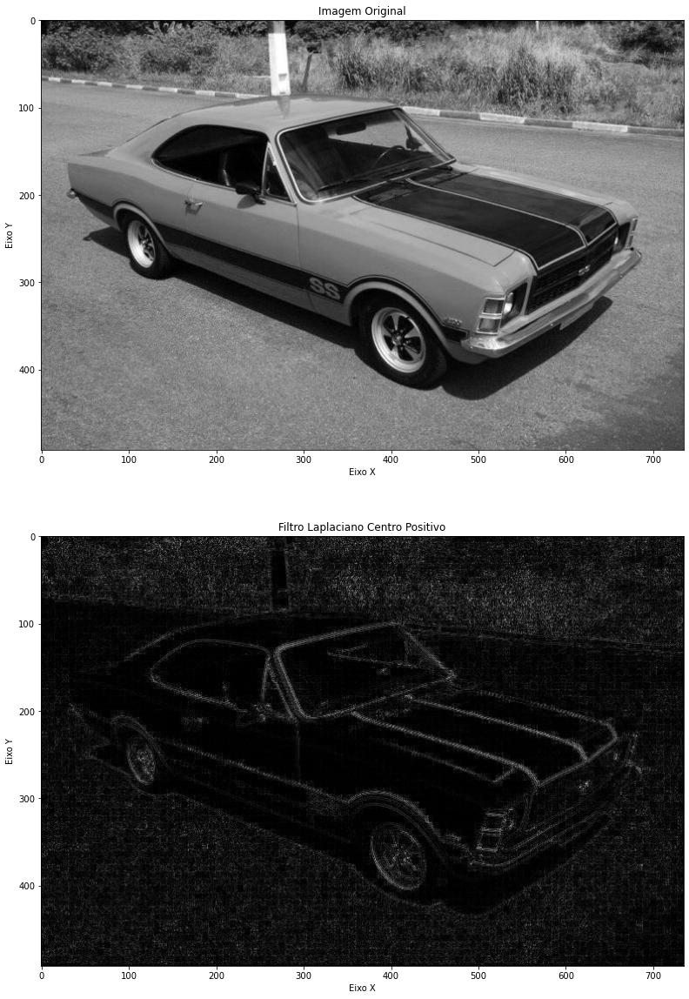

In [85]:
imagem = rgb2gray(imread("carro.jpg"))
filtro_laplaciano = convolucao(imagem,laplaciano,"ignore","3,3")

plt.figure(figsize=(20, 20))

plt.subplot(2, 1, 1)  
plt.imshow(imagem, cmap='gray')
plt.title('Imagem Original')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(2, 1, 2) 

plt.imshow(filtro_laplaciano, cmap='gray')
plt.title('Filtro Laplaciano Centro Positivo')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.show()

4) Implemente uma máscara de nitidez e uma filtragem high-boost utilizando o algoritmo da questão 1. Explique os passos de ambas implementações e diferencie o resultado das mesmas. Utilize pelo menos 5 valores de k no intervalor 0 < k < 2.

Para obter obter a máscara de nitidez os seguintes passos foram seguidos,  a seguinte fórmula gm = f (x, y ) - f' (x, y ), onde gm é a máscara de nitidez, f (x,y) a imagem original e f' (x,y) uma imagem suavizada, neste caso foi usada a função média. O próximo passo consiste em adicionar uma porção da máscara para imagem original com a fórmula gm = f (x, y ) + k * gm (x, y ), onde k o quantitavo da máscara que é adicionado a imagem original. Quando K é maior que 1 o processo é chamado de filtragem high-boost.

Text(0, 0.5, 'Eixo Y')

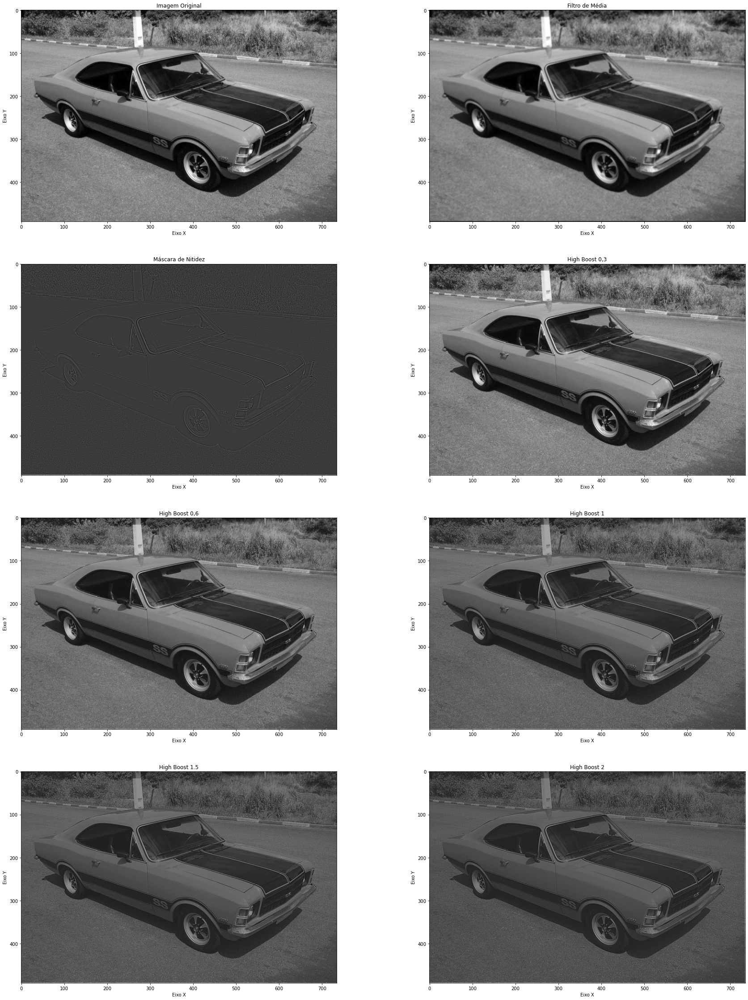

In [134]:
imagem_original = rgb2gray(imread("carro.jpg"))*255
imagem_media = convolucao(imagem_original,media,"ignore","3,3")
mascara_nitidez = imagem_original - imagem_media
high_boost_0_3 = imagem_original + 0.3 * mascara_nitidez
high_boost_0_6 = imagem_original + 0.6 * mascara_nitidez
high_boost_1 = imagem_original + 1 * mascara_nitidez
high_boost_1_5 = imagem_original + 1.5 * mascara_nitidez
high_boost_2 = imagem_original + 2 * mascara_nitidez

plt.figure(figsize=(30, 40))

plt.subplot(4, 2, 1)  
plt.imshow(imagem_original, cmap='gray')
plt.title('Imagem Original')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 2) 

plt.imshow(imagem_media, cmap='gray')
plt.title('Filtro de Média')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 3) 

plt.imshow(mascara_nitidez, cmap='gray')
plt.title('Máscara de Nitidez')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 4) 

plt.imshow(high_boost_0_3, cmap='gray')
plt.title('High Boost 0,3')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 5) 

plt.imshow(high_boost_0_6, cmap='gray')
plt.title('High Boost 0,6')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 6) 

plt.imshow(high_boost_1, cmap='gray')
plt.title('High Boost 1')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 7) 

plt.imshow(high_boost_1_5, cmap='gray')
plt.title('High Boost 1.5')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(4, 2, 8) 

plt.imshow(high_boost_2, cmap='gray')
plt.title('High Boost 2')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

5) Aplique os filtros da média e mediana em uma imagem ruidosa, o que aconteceu? Qual tipo de ruído existia na imagem?

Para esta questão foi utilizada uma imagem com ruído sal e pimenta, este tipo de ruído tem a característica de possuir pixels com valores extremos. Na imagem que foi aplicado o filtro de média é possível notar que os ruídos diminuíram, porém o filtro de mediana teve um resultado mais satisfatório, isto acontece pelo fato de o filtro de média ser mais sensível a valores extremos (píxeis brancos ou pretos), pois quando o filtro está calculando os valores da máscara onde existe o ruído, o resultado pode ser
fortemente influenciado por esses outliers, por outro lado, o filtro de mediana classifica os valores dos pixels em ordem e substitui o valor do pixel central pelo valor mediano, dessa forma, o resultado final não sofre a mesma influência dos pixels outliers como acontece com o filtro de média.

/tmp/ipykernel_4806/4185560847.py:1: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  imagem = rgb2gray(imread("onca.png"))


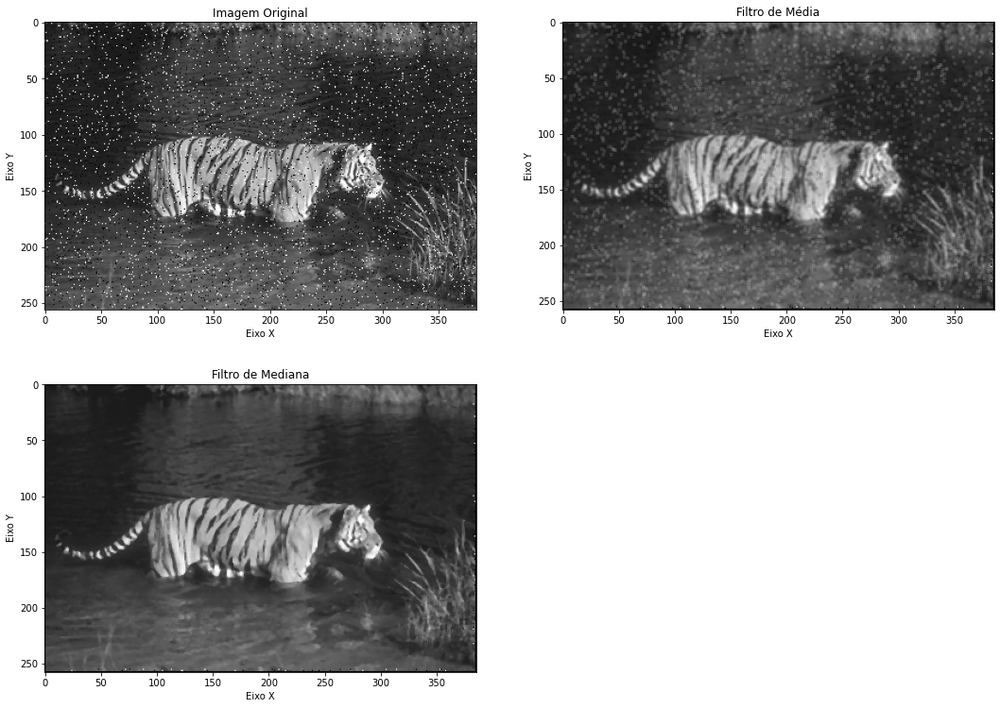

In [135]:
imagem = rgb2gray(imread("onca.png"))
filtro_media = convolucao(imagem,media,"zero","3,3")
filtro_mediana = convolucao(imagem,mediana,"zero","3,3")

plt.figure(figsize=(18, 20))

plt.subplot(3, 2, 1)  
plt.imshow(imagem, cmap='gray')
plt.title('Imagem Original')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(3, 2, 2) 

plt.imshow(filtro_media, cmap='gray')
plt.title('Filtro de Média')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.subplot(3, 2, 3) 

plt.imshow(filtro_mediana, cmap='gray')
plt.title('Filtro de Mediana')
plt.xlabel('Eixo X')
plt.ylabel('Eixo Y')

plt.show()

In [55]:
matriz10 = np.arange(1, 65).reshape((8, 8))
matriz10

array([[ 1,  2,  3,  4,  5,  6,  7,  8],
       [ 9, 10, 11, 12, 13, 14, 15, 16],
       [17, 18, 19, 20, 21, 22, 23, 24],
       [25, 26, 27, 28, 29, 30, 31, 32],
       [33, 34, 35, 36, 37, 38, 39, 40],
       [41, 42, 43, 44, 45, 46, 47, 48],
       [49, 50, 51, 52, 53, 54, 55, 56],
       [57, 58, 59, 60, 61, 62, 63, 64]])

In [56]:
novo = convolucao(matriz10,media,"replicar","5,5")


In [57]:
novo

array([[ 1.,  1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  8.,  8.],
       [ 1.,  1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  8.,  8.],
       [ 1.,  1., 19., 20., 21., 22.,  5.,  6.,  7.,  8.,  8.,  8.],
       [ 9.,  9., 27., 28., 29., 30., 13., 14., 15., 16., 16., 16.],
       [17., 17., 35., 36., 37., 38., 21., 22., 23., 24., 24., 24.],
       [25., 25., 43., 44., 45., 46., 29., 30., 31., 32., 32., 32.],
       [33., 33., 33., 34., 35., 36., 37., 38., 39., 40., 40., 40.],
       [41., 41., 41., 42., 43., 44., 45., 46., 47., 48., 48., 48.],
       [49., 49., 49., 50., 51., 52., 53., 54., 55., 56., 56., 56.],
       [57., 57., 57., 58., 59., 60., 61., 62., 63., 64., 64., 64.],
       [57., 57., 57., 58., 59., 60., 61., 62., 63., 64., 64., 64.],
       [57., 57., 57., 58., 59., 60., 61., 62., 63., 64., 64., 64.]])

In [84]:
filtro_laplaciano.max()

0.005068696655132642